In [10]:
import torch
from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
from PIL import Image
from pdf2image import convert_from_path
from PIL import Image
import os
from tqdm import tqdm
import json
from jiwer import wer, cer, process_words
import re
import numpy as np
import  cv2
import matplotlib.pyplot as plt

In [13]:
def pdf_to_images(path, dpi=300):
    images = []
    if os.path.isfile(path):
        images.extend(convert_from_path(path, dpi=dpi))
    else:
        for pdf_file in tqdm(os.listdir(path), desc="Converting PDFs"):
            if pdf_file.lower().endswith('.pdf'):
                pdf_path = os.path.join(path, pdf_file)
                images.extend(convert_from_path(pdf_path, dpi=dpi))
    print(f"\n✅ Conversion complete!")
    return images

pages = pdf_to_images("/Users/maryamsaad/Documents/arabic-ocr-transformer/من معتمدات الكتب/لسان العرب 15 مجلد/لسان العرب (13).pdf")


✅ Conversion complete!


In [14]:
print(len(pages))

568


In [17]:
pages=pages[:30]

### image processing

In [36]:
#blurring images
blurred_pages = []
for img in pages:
    img_array = np.array(img)
    blurred_img = cv2.GaussianBlur(img_array, (5, 5), 0)
    blurred_pages.append(Image.fromarray(blurred_img))


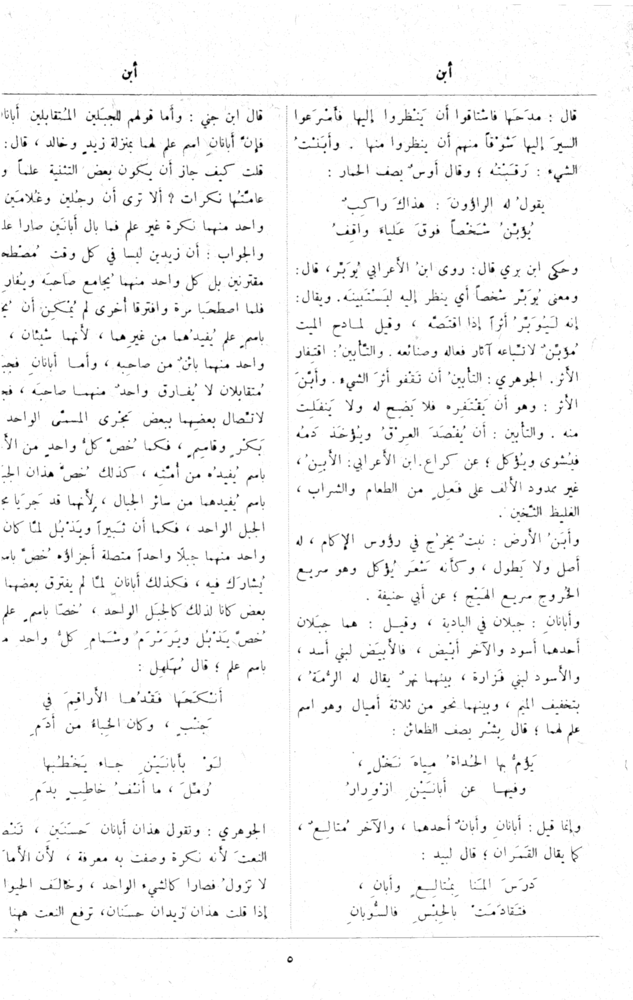

In [37]:
#dilating images
dilated_pages = []
for img in blurred_pages:
    img_array = np.array(img)
    kernel = np.ones((3, 3), np.uint8)
    dilated_img = cv2.dilate(img_array, kernel, iterations=1)
    dilated_pages.append(Image.fromarray(dilated_img))
dilated_pages[4]

In [38]:
#erosing images
erosed_pages = []
for img in dilated_pages:
    img_array = np.array(img)
    kernel = np.ones((3, 3), np.uint8)
    erosed_img = cv2.erode(img_array, kernel, iterations=1)
    erosed_pages.append(Image.fromarray(erosed_img))




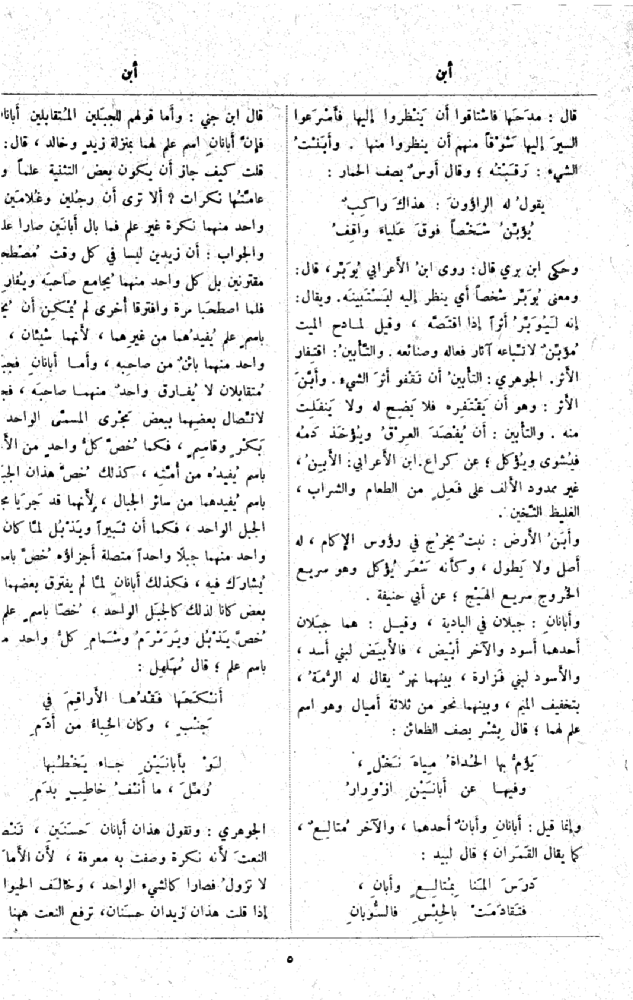

In [39]:
erosed_pages[4]

In [26]:
from paddleocr import LayoutDetection

model = LayoutDetection(model_name="PP-DocLayout_plus-L",

                        layout_nms=True
                        )


Using official model (PP-DocLayout_plus-L), the model files will be automatically downloaded and saved in `/Users/maryamsaad/.paddlex/official_models/PP-DocLayout_plus-L`.
Fetching 6 files: 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]


{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.7550204396247864, 'coordinate': [np.float32(620.52924), np.float32(1477.224), np.float32(947.1856), np.float32(1561.5305)]}, {'cls_id': 10, 'label': 'doc_title', 'score': 0.6281904578208923, 'coordinate': [np.float32(285.0945), np.float32(850.10065), np.float32(1266.3613), np.float32(1098.0881)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172413_8705`.



=== Page 1, Result 1 ===


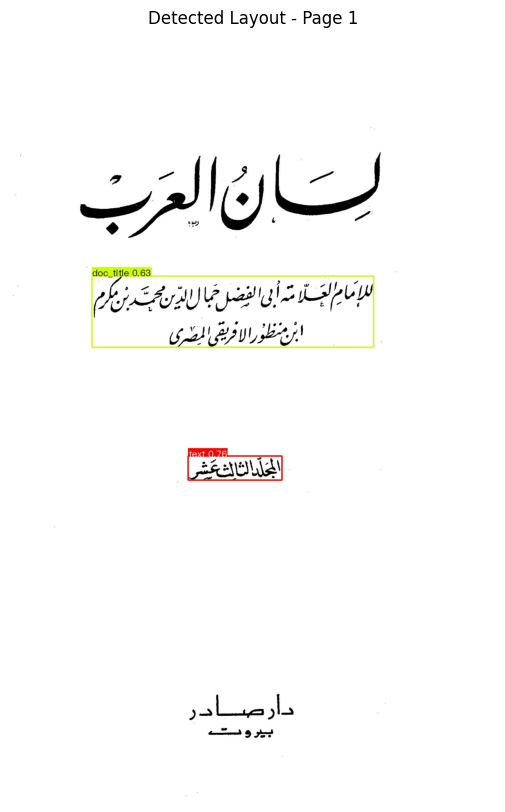

{'res': {'input_path': None, 'page_index': None, 'boxes': array([], dtype=float64)}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172414_8947`.



=== Page 2, Result 1 ===


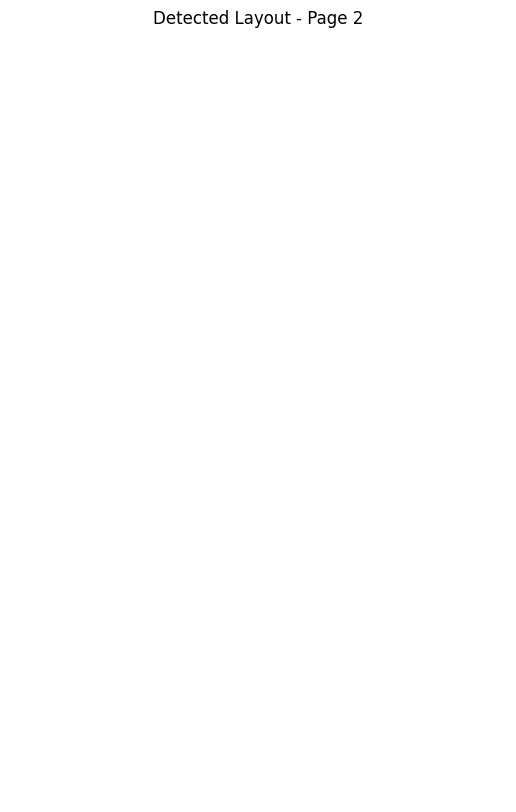

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.9095298051834106, 'coordinate': [0, np.float32(1055.7767), np.float32(729.9786), np.float32(2506.1772)]}, {'cls_id': 2, 'label': 'text', 'score': 0.907259464263916, 'coordinate': [np.float32(779.40753), np.float32(1500.4038), np.float32(1590.29), np.float32(2501.4895)]}, {'cls_id': 1, 'label': 'image', 'score': 0.6674279570579529, 'coordinate': [0, np.float32(3.45822), np.float32(1695.9364), np.float32(1029.9954)]}, {'cls_id': 0, 'label': 'paragraph_title', 'score': 0.5352773070335388, 'coordinate': [np.float32(1100.0774), np.float32(1399.9346), np.float32(1289.925), np.float32(1469.7233)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5314118266105652, 'coordinate': [np.float32(780.0843), np.float32(1201.9668), np.float32(1570.7616), np.float32(1475.2993)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp an


=== Page 3, Result 1 ===


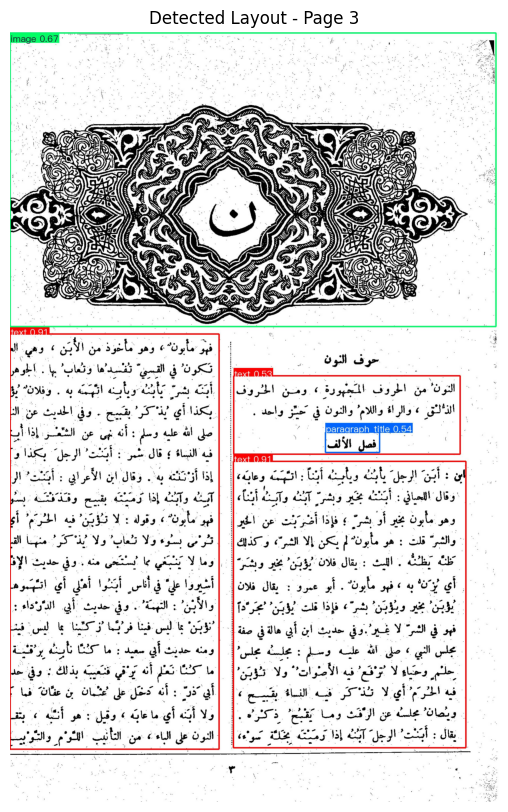

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.5463750958442688, 'coordinate': [np.float32(85.63265), np.float32(261.63205), np.float32(905.18835), np.float32(2490.1924)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5410836338996887, 'coordinate': [np.float32(937.069), np.float32(261.7222), 1710, np.float32(572.94946)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172415_4899`.



=== Page 4, Result 1 ===


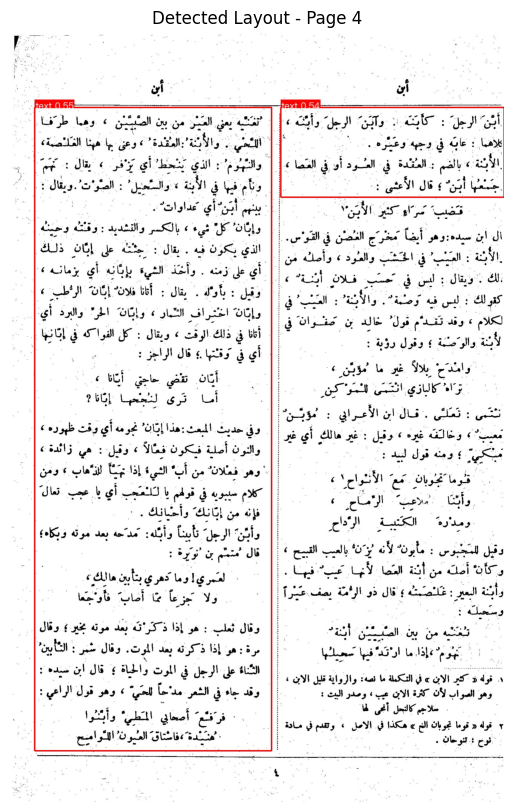

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.7750296592712402, 'coordinate': [0, np.float32(256.68784), np.float32(735.9482), np.float32(1827.0966)]}, {'cls_id': 2, 'label': 'text', 'score': 0.6503173112869263, 'coordinate': [np.float32(774.8238), np.float32(256.8964), np.float32(1569.3921), np.float32(648.0433)]}, {'cls_id': 2, 'label': 'text', 'score': 0.527878999710083, 'coordinate': [np.float32(786.6497), np.float32(1999.5123), np.float32(1580.661), np.float32(2492.3352)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5225501656532288, 'coordinate': [0, np.float32(1829.7166), np.float32(733.48846), np.float32(2502.914)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172416_5392`.



=== Page 5, Result 1 ===


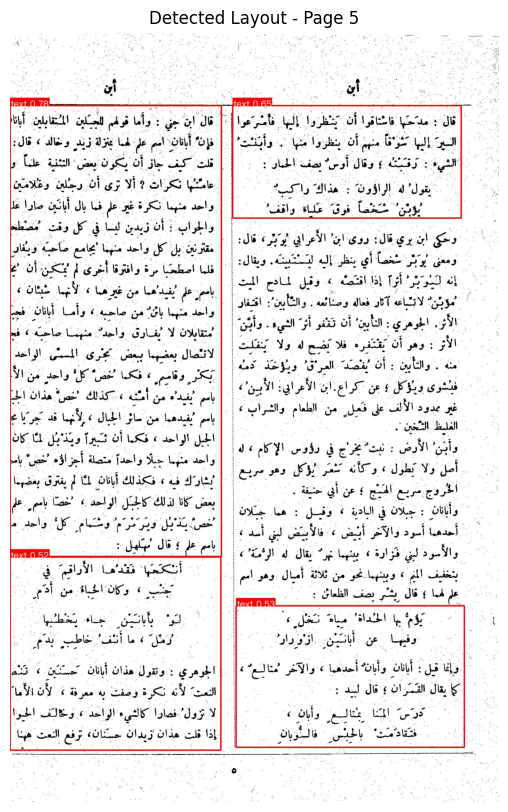

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.788090169429779, 'coordinate': [np.float32(932.205), np.float32(265.7426), 1704, np.float32(2496.4033)]}, {'cls_id': 2, 'label': 'text', 'score': 0.7593764066696167, 'coordinate': [np.float32(88.18785), np.float32(1135.7224), np.float32(882.7206), np.float32(1804.6831)]}, {'cls_id': 2, 'label': 'text', 'score': 0.7561181783676147, 'coordinate': [np.float32(85.28571), np.float32(1975.5026), np.float32(874.5283), np.float32(2490.6238)]}, {'cls_id': 2, 'label': 'text', 'score': 0.6826990842819214, 'coordinate': [np.float32(95.419266), np.float32(263.89172), np.float32(895.512), np.float32(792.9107)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5048530101776123, 'coordinate': [np.float32(192.34908), np.float32(1815.246), np.float32(782.7313), np.float32(1967.322)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timesta


=== Page 6, Result 1 ===


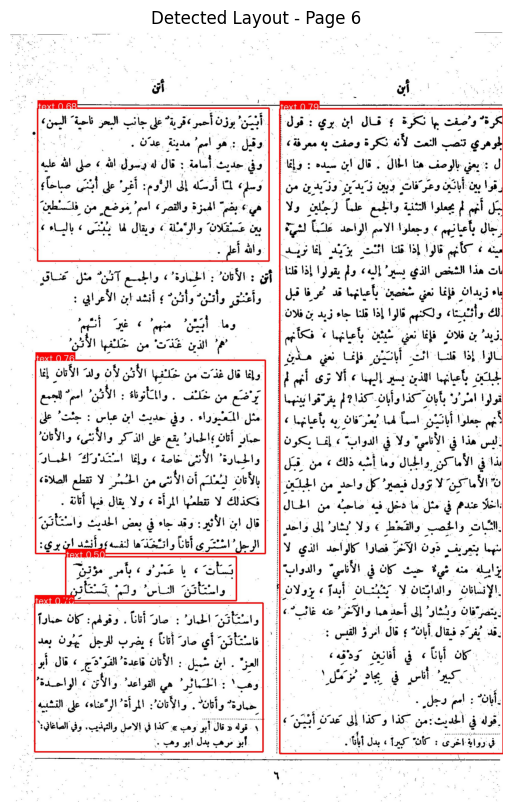

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.7515546679496765, 'coordinate': [0, np.float32(711.3171), np.float32(737.9786), np.float32(2109.124)]}, {'cls_id': 2, 'label': 'text', 'score': 0.679485559463501, 'coordinate': [0, np.float32(262.02997), np.float32(724.9444), np.float32(702.6797)]}, {'cls_id': 2, 'label': 'text', 'score': 0.6716958284378052, 'coordinate': [0, np.float32(2114.4087), np.float32(766.7977), np.float32(2491.2104)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5347292423248291, 'coordinate': [np.float32(778.64844), np.float32(669.7853), np.float32(1568.4677), np.float32(1422.9473)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5254220962524414, 'coordinate': [np.float32(768.65924), np.float32(254.69925), np.float32(1563.5568), np.float32(652.90717)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172417_661


=== Page 7, Result 1 ===


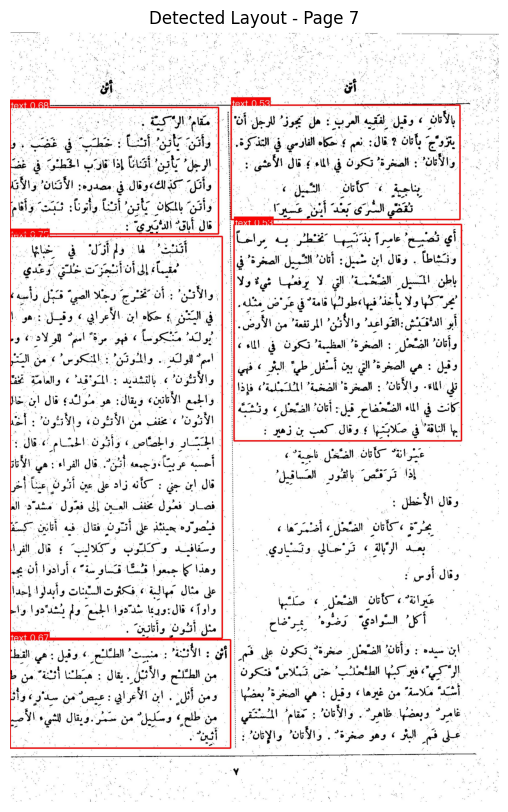

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.7954832315444946, 'coordinate': [np.float32(86.46953), np.float32(324.0666), np.float32(903.0869), np.float32(2308.0535)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5390664339065552, 'coordinate': [np.float32(184.58049), np.float32(2323.663), np.float32(779.0391), np.float32(2472.6921)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172418_3421`.



=== Page 8, Result 1 ===


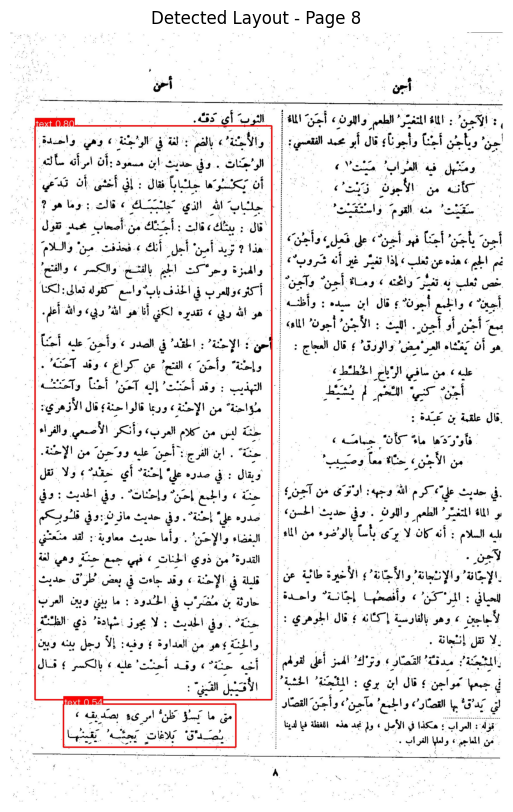

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.6217522025108337, 'coordinate': [np.float32(784.6046), np.float32(2536.7485), np.float32(808.048), np.float32(2567.699)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5419378876686096, 'coordinate': [np.float32(302.40204), np.float32(150.57642), np.float32(367.58548), np.float32(203.72685)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5203379392623901, 'coordinate': [np.float32(772.8239), np.float32(249.43497), np.float32(1606.5146), np.float32(2477.3333)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172419_1099`.



=== Page 9, Result 1 ===


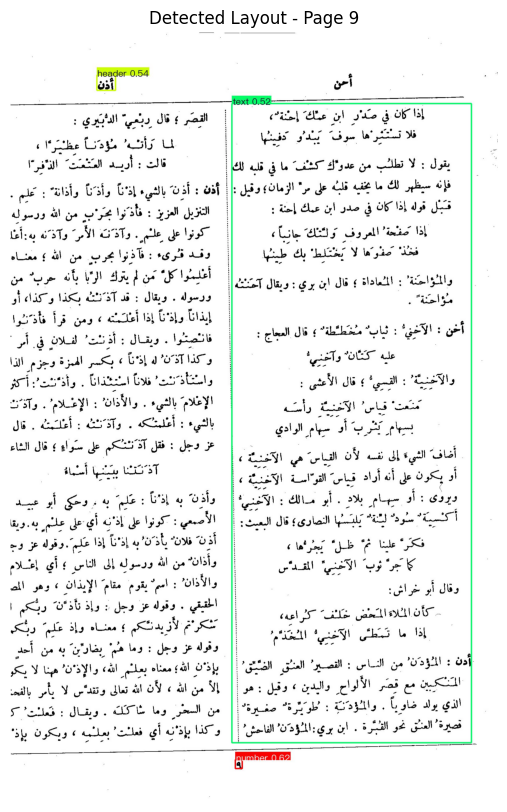

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.7909095287322998, 'coordinate': [np.float32(892.2541), np.float32(2541.1719), np.float32(928.6965), np.float32(2570.6738)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5085582733154297, 'coordinate': [np.float32(1344.4489), np.float32(152.4825), np.float32(1411.5498), np.float32(206.88644)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172420_5414`.



=== Page 10, Result 1 ===


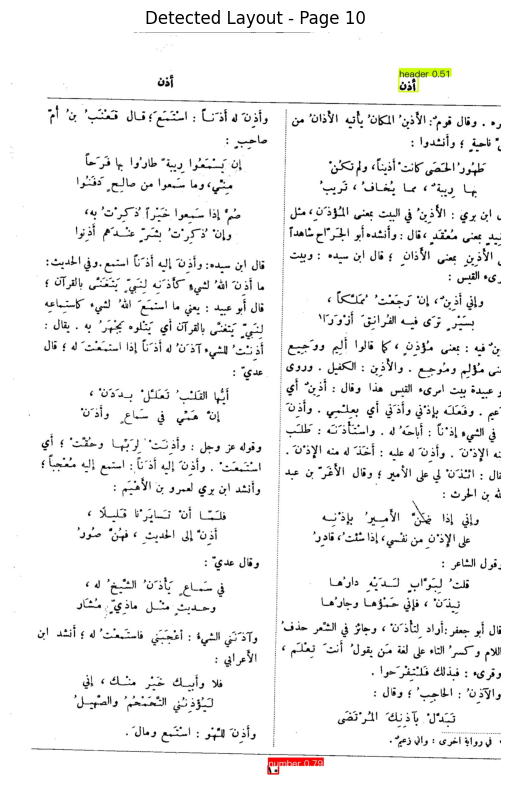

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8587576150894165, 'coordinate': [np.float32(783.7726), np.float32(2533.577), np.float32(825.32635), np.float32(2565.473)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5173484683036804, 'coordinate': [np.float32(305.80344), np.float32(142.81438), np.float32(370.74188), np.float32(196.31564)]}, {'cls_id': 1, 'label': 'image', 'score': 0.5171846747398376, 'coordinate': [0, np.float32(238.68402), np.float32(1582.1652), np.float32(2471.5452)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172420_5784`.



=== Page 11, Result 1 ===


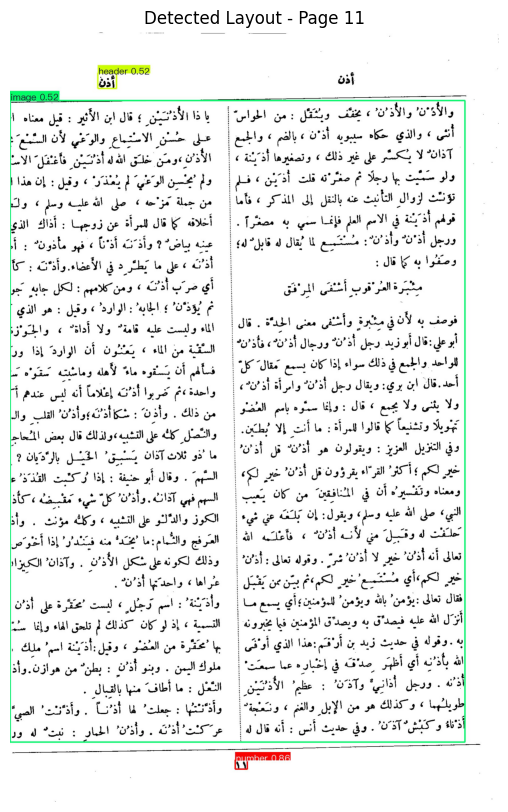

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8464004397392273, 'coordinate': [np.float32(889.9092), np.float32(2523.4287), np.float32(929.83746), np.float32(2554.8027)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5570163130760193, 'coordinate': [np.float32(504.67517), np.float32(125.72616), np.float32(571.8044), np.float32(177.94994)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172421_1363`.



=== Page 12, Result 1 ===


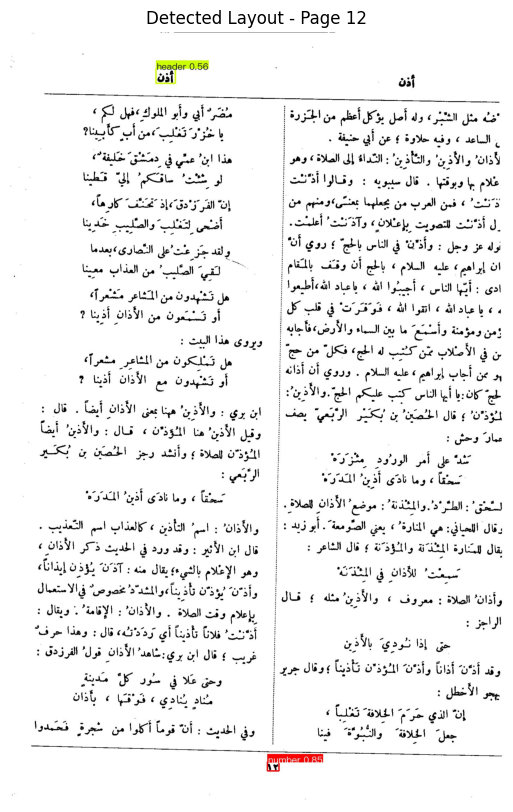

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8428246974945068, 'coordinate': [np.float32(781.9222), np.float32(2534.3452), np.float32(821.57605), np.float32(2565.0225)]}, {'cls_id': 1, 'label': 'image', 'score': 0.6020568013191223, 'coordinate': [0, np.float32(242.49641), np.float32(1587.1843), np.float32(2488.5715)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172422_4956`.



=== Page 13, Result 1 ===


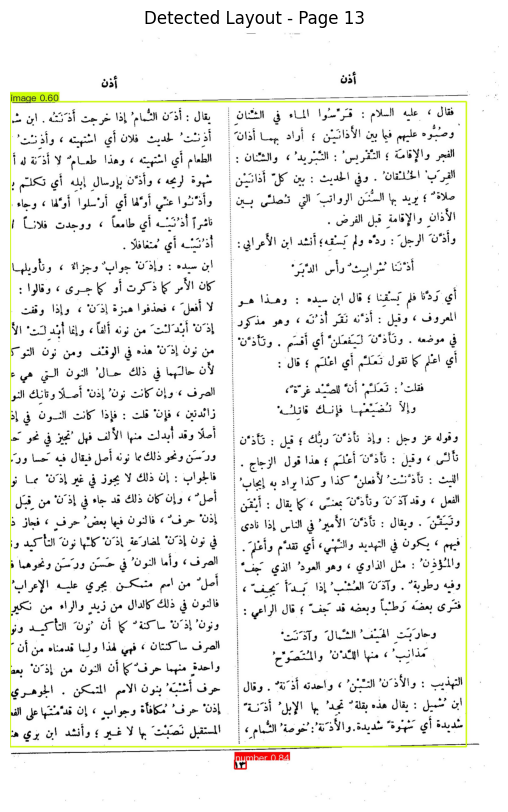

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8240912556648254, 'coordinate': [np.float32(887.9943), np.float32(2517.6616), np.float32(924.8114), np.float32(2550.2986)]}, {'cls_id': 13, 'label': 'algorithm', 'score': 0.5227611064910889, 'coordinate': [np.float32(81.434746), np.float32(227.1413), 1700, np.float32(2487.7886)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172422_5933`.



=== Page 14, Result 1 ===


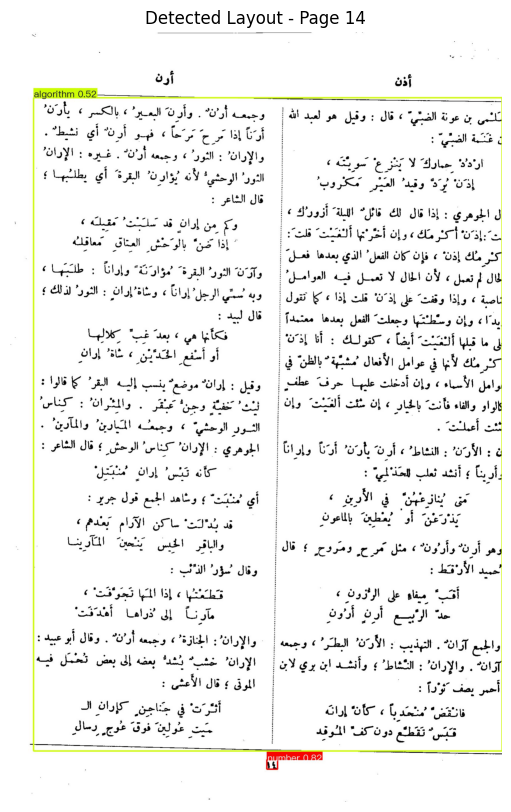

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.807864248752594, 'coordinate': [np.float32(779.59174), np.float32(2510.8755), np.float32(819.40894), np.float32(2541.117)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5434466004371643, 'coordinate': [np.float32(308.26077), np.float32(119.127975), np.float32(384.07965), np.float32(178.26068)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172423_2500`.



=== Page 15, Result 1 ===


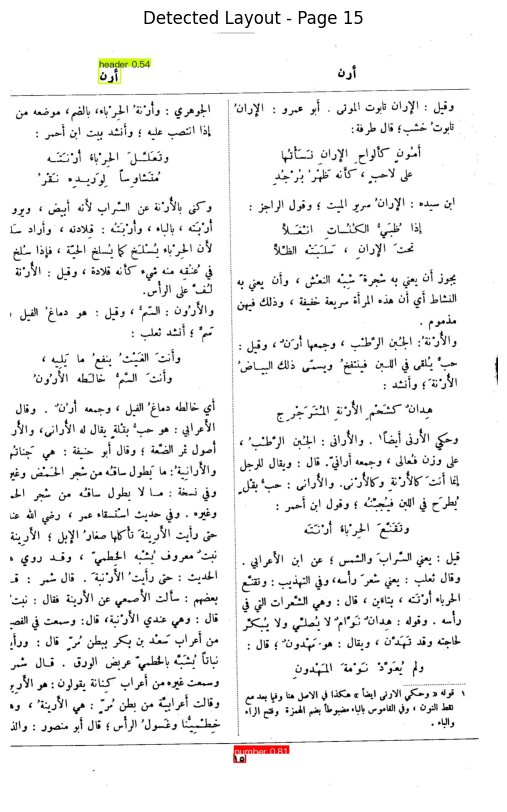

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.7927831411361694, 'coordinate': [np.float32(886.2233), np.float32(2503.2075), np.float32(930.0957), np.float32(2535.5903)]}, {'cls_id': 1, 'label': 'image', 'score': 0.6342458128929138, 'coordinate': [np.float32(82.85211), np.float32(183.46376), 1703, np.float32(2449.4365)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172424_3917`.



=== Page 16, Result 1 ===


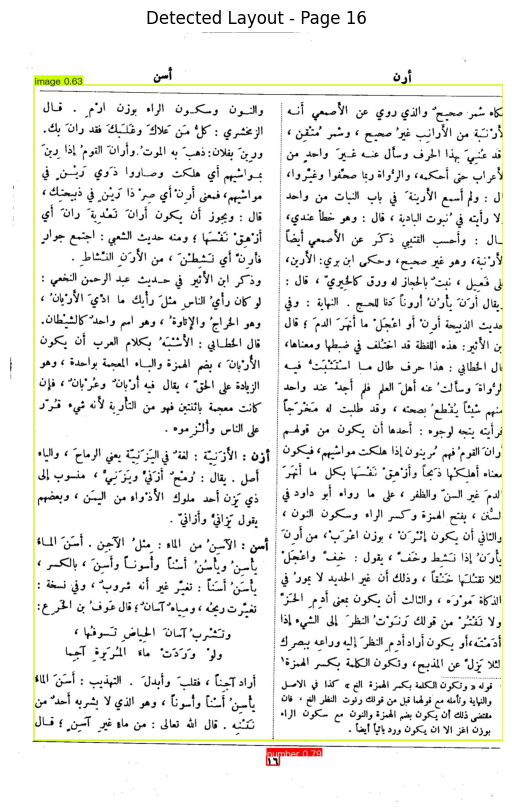

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8160434365272522, 'coordinate': [np.float32(783.73987), np.float32(2515.775), np.float32(823.8976), np.float32(2545.31)]}, {'cls_id': 1, 'label': 'image', 'score': 0.5942655801773071, 'coordinate': [0, np.float32(219.9351), np.float32(1595.0978), np.float32(2470.052)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172425_6353`.



=== Page 17, Result 1 ===


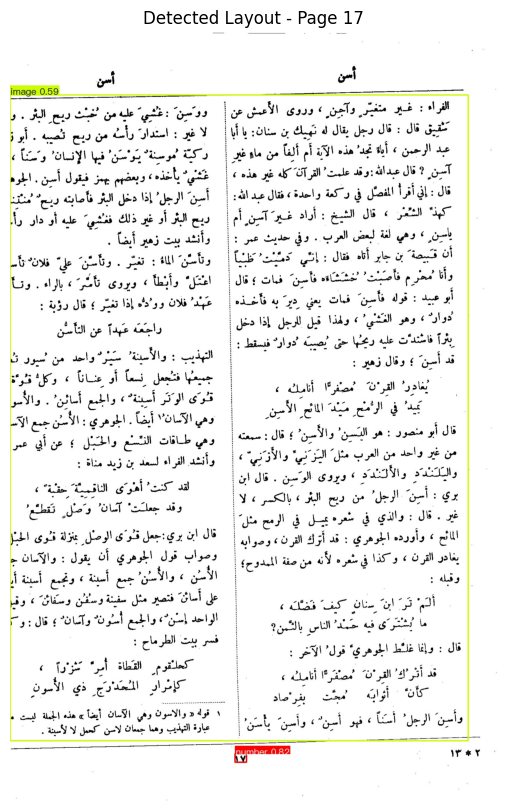

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8490413427352905, 'coordinate': [np.float32(881.1317), np.float32(2513.278), np.float32(921.5308), np.float32(2543.7825)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5202714800834656, 'coordinate': [np.float32(926.5908), np.float32(233.77045), np.float32(1697.8617), np.float32(2474.7297)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172425_1317`.



=== Page 18, Result 1 ===


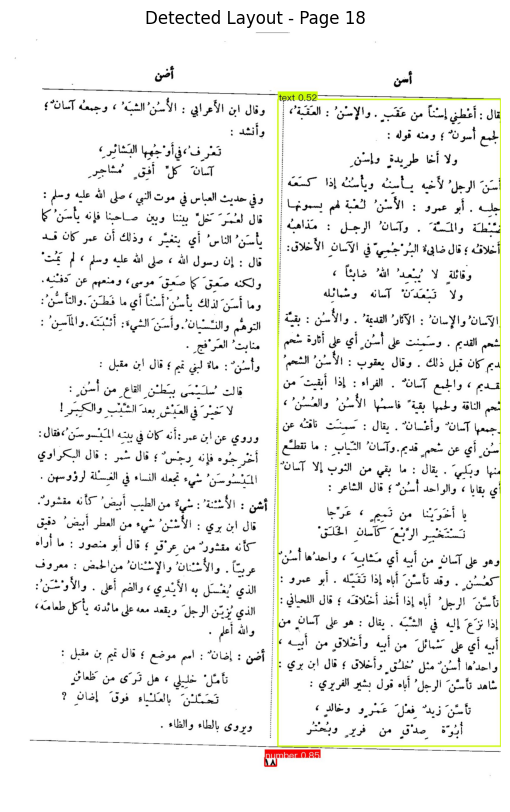

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.854059636592865, 'coordinate': [np.float32(770.2427), np.float32(2526.9878), np.float32(810.491), np.float32(2557.7822)]}, {'cls_id': 13, 'label': 'algorithm', 'score': 0.5336154699325562, 'coordinate': [0, np.float32(129.56276), np.float32(1595.604), np.float32(2468.2354)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172426_5879`.



=== Page 19, Result 1 ===


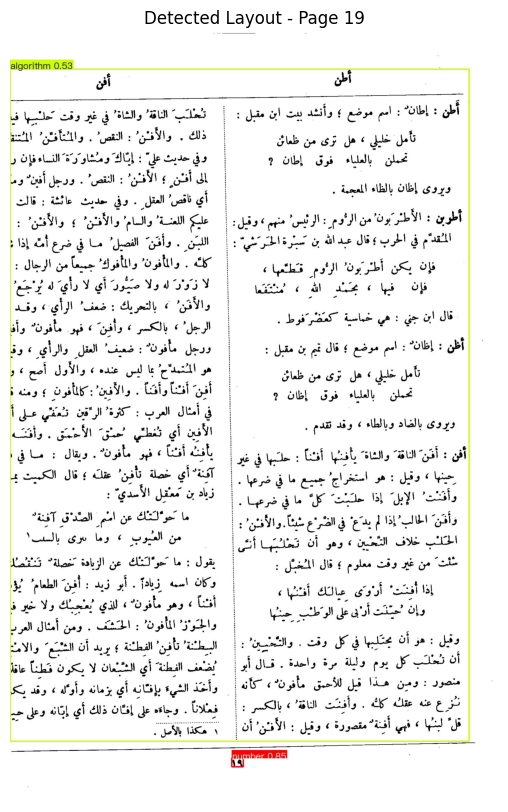

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8163542151451111, 'coordinate': [np.float32(889.31934), np.float32(2519.0842), np.float32(928.86725), np.float32(2547.6738)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172427_5646`.



=== Page 20, Result 1 ===


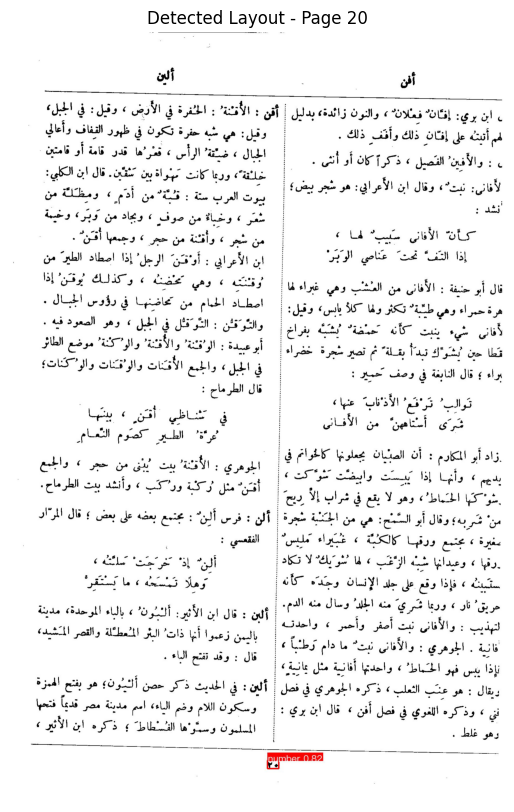

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8108822107315063, 'coordinate': [np.float32(783.046), np.float32(2512.4043), np.float32(826.4702), np.float32(2546.8833)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172428_2157`.



=== Page 21, Result 1 ===


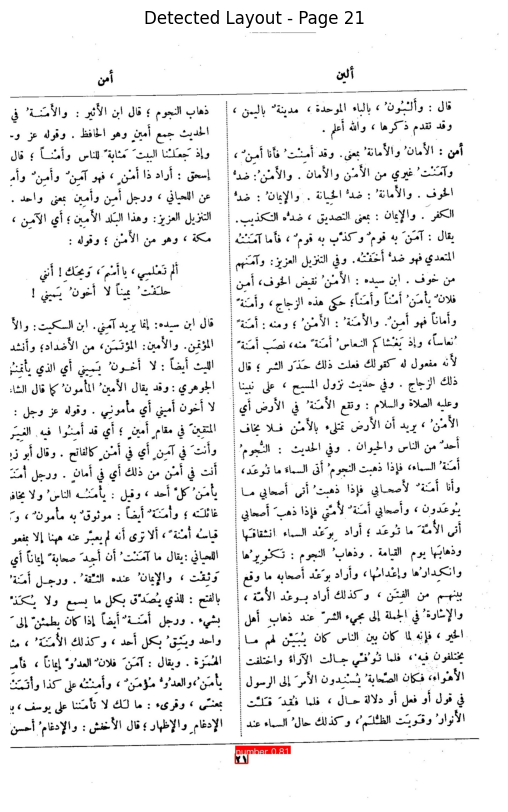

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8736584186553955, 'coordinate': [np.float32(881.8051), np.float32(2506.1426), np.float32(924.3366), np.float32(2537.271)]}, {'cls_id': 12, 'label': 'header', 'score': 0.6406285166740417, 'coordinate': [np.float32(1350.0519), np.float32(131.83679), np.float32(1416.745), np.float32(193.37195)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5031753182411194, 'coordinate': [np.float32(101.29661), np.float32(228.12018), np.float32(894.4902), np.float32(1544.3217)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172428_1596`.



=== Page 22, Result 1 ===


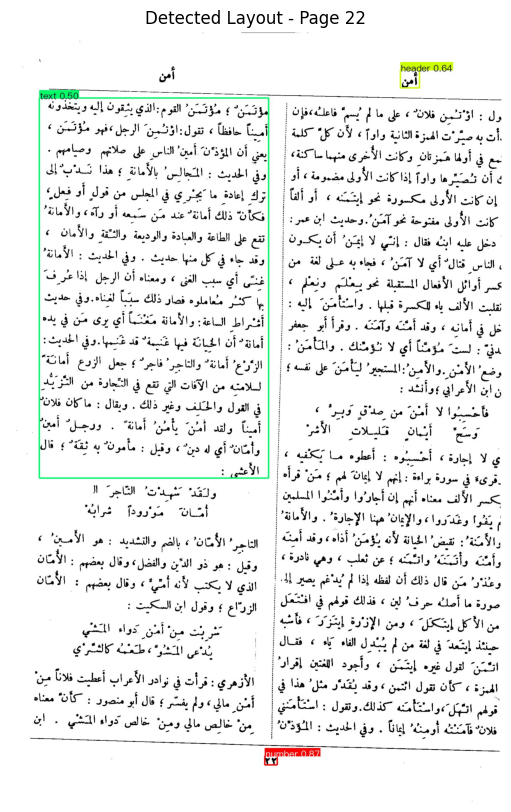

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8643204569816589, 'coordinate': [np.float32(776.35754), np.float32(2522.85), np.float32(819.8309), np.float32(2555.1072)]}, {'cls_id': 2, 'label': 'text', 'score': 0.6116956472396851, 'coordinate': [0, np.float32(247.69986), np.float32(735.2254), np.float32(2462.901)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5999838709831238, 'coordinate': [np.float32(777.581), np.float32(235.38046), np.float32(1576.8281), np.float32(2455.3813)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5698137283325195, 'coordinate': [np.float32(312.63266), np.float32(129.33626), np.float32(376.92838), np.float32(194.04973)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5062183737754822, 'coordinate': [np.float32(1145.354), np.float32(122.28708), np.float32(1212.3123), np.float32(188.34296)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named w


=== Page 23, Result 1 ===


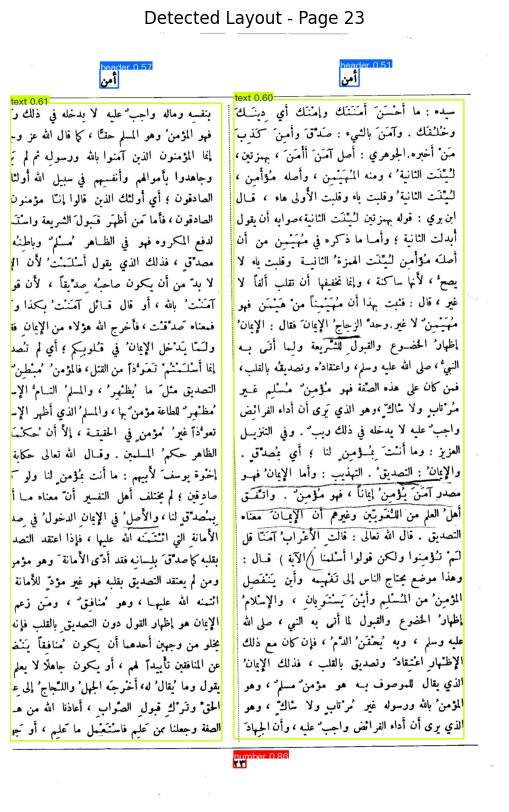

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 2, 'label': 'text', 'score': 0.9316657185554504, 'coordinate': [np.float32(99.68042), np.float32(240.47276), np.float32(892.8735), np.float32(1905.787)]}, {'cls_id': 2, 'label': 'text', 'score': 0.9089476466178894, 'coordinate': [np.float32(83.40053), np.float32(1920.9347), np.float32(869.10706), np.float32(2441.616)]}, {'cls_id': 2, 'label': 'text', 'score': 0.8803937435150146, 'coordinate': [np.float32(934.1863), np.float32(241.8299), np.float32(1708.4065), np.float32(2452.287)]}, {'cls_id': 3, 'label': 'number', 'score': 0.8619562387466431, 'coordinate': [np.float32(893.6096), np.float32(2514.2085), np.float32(933.5736), np.float32(2544.576)]}, {'cls_id': 12, 'label': 'header', 'score': 0.7067496180534363, 'coordinate': [np.float32(1337.8983), np.float32(132.9368), np.float32(1402.3042), np.float32(191.73564)]}, {'cls_id': 12, 'label': 'header', 'score': 0.6577892899513245, 'coordinate': [np.float32(503.74634), np


=== Page 24, Result 1 ===


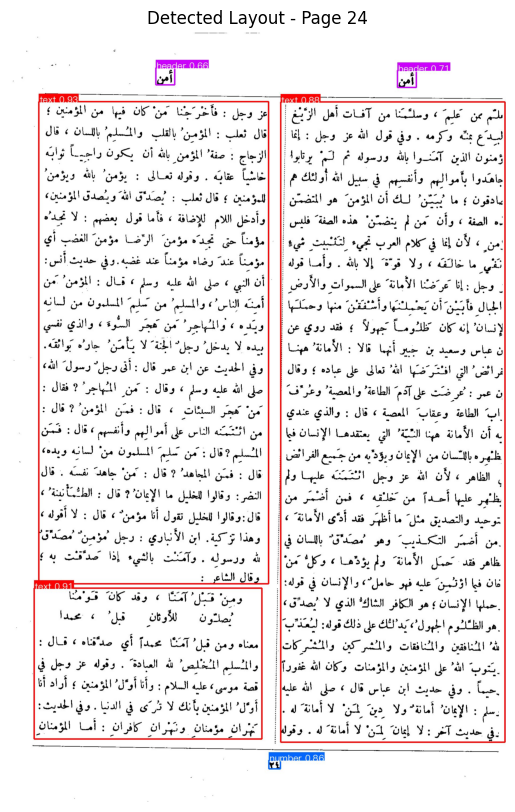

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8167689442634583, 'coordinate': [np.float32(784.81885), np.float32(2535.4336), np.float32(827.689), np.float32(2566.8682)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172430_7429`.



=== Page 25, Result 1 ===


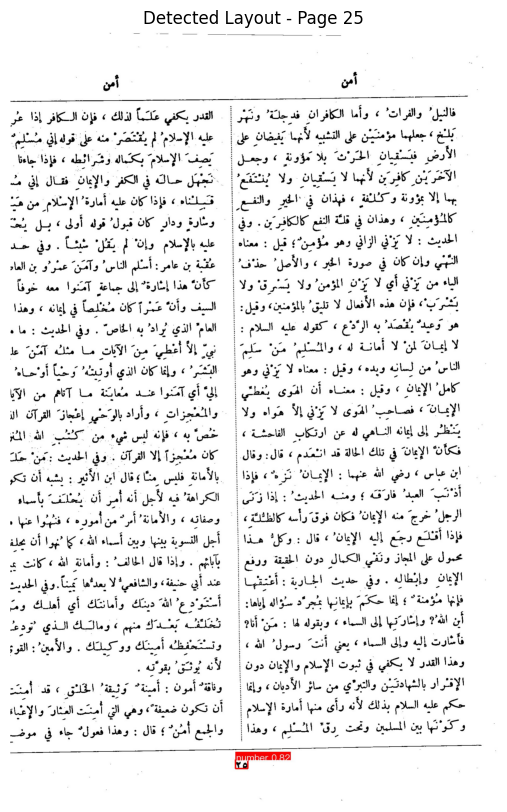

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8678581714630127, 'coordinate': [np.float32(882.6293), np.float32(2526.0798), np.float32(925.18677), np.float32(2557.242)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5496751070022583, 'coordinate': [np.float32(1323.0602), np.float32(142.49994), np.float32(1390.6517), np.float32(203.61166)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172431_5653`.



=== Page 26, Result 1 ===


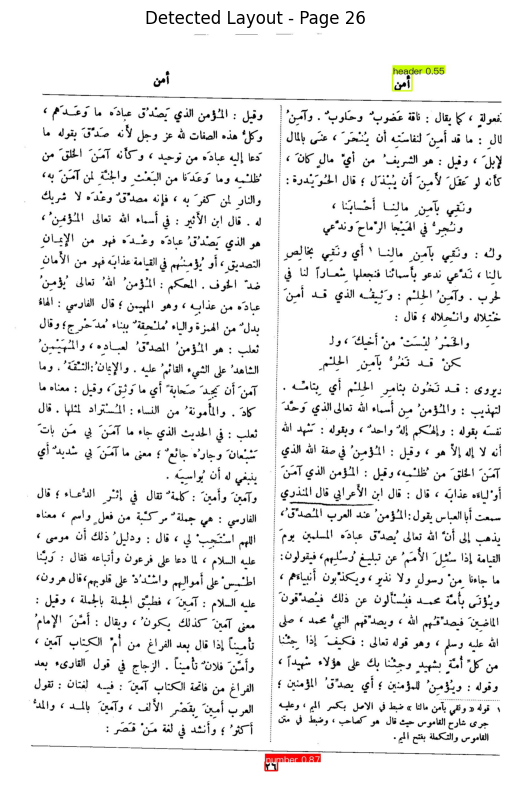

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.865727424621582, 'coordinate': [np.float32(803.4991), np.float32(2515.3882), np.float32(847.626), np.float32(2548.2253)]}, {'cls_id': 1, 'label': 'image', 'score': 0.629231870174408, 'coordinate': [0, np.float32(123.74821), np.float32(1607.8745), np.float32(2456.0244)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172432_5806`.



=== Page 27, Result 1 ===


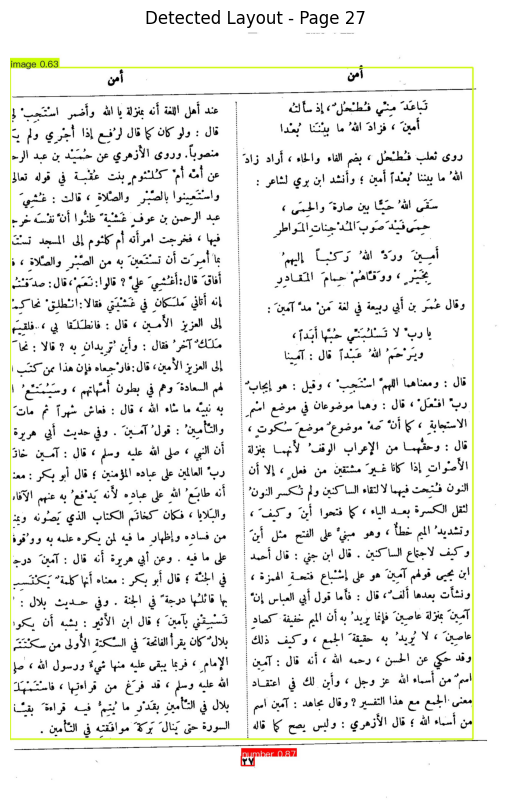

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8498963713645935, 'coordinate': [np.float32(863.78394), np.float32(2511.269), np.float32(906.82477), np.float32(2541.1526)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5750247240066528, 'coordinate': [np.float32(68.32558), np.float32(206.6959), np.float32(876.426), np.float32(2446.2502)]}, {'cls_id': 2, 'label': 'text', 'score': 0.5332788825035095, 'coordinate': [np.float32(908.32166), np.float32(230.24165), 1698, np.float32(2457.325)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172433_7172`.



=== Page 28, Result 1 ===


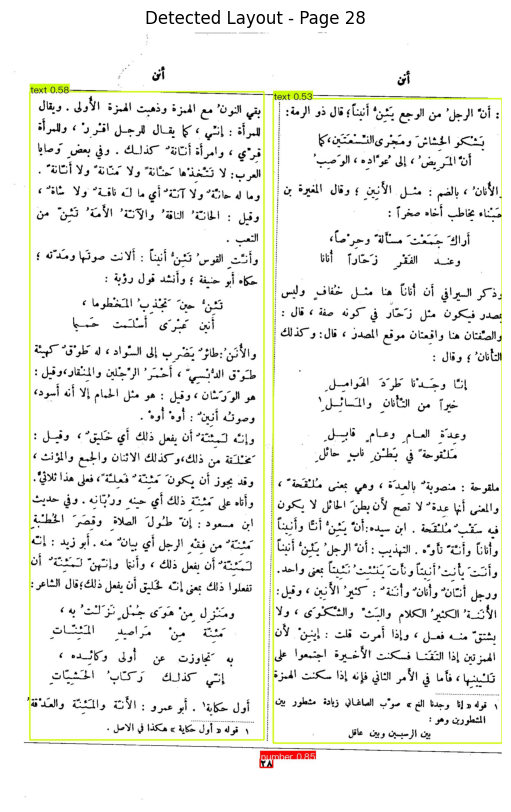

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8690739870071411, 'coordinate': [np.float32(806.63275), np.float32(2529.65), np.float32(851.66187), np.float32(2561.4194)]}, {'cls_id': 2, 'label': 'text', 'score': 0.6089812517166138, 'coordinate': [0, np.float32(254.17258), np.float32(763.9005), np.float32(2470.9417)]}, {'cls_id': 12, 'label': 'header', 'score': 0.5081897974014282, 'coordinate': [np.float32(1175.4152), np.float32(125.38215), np.float32(1231.9054), np.float32(186.64444)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172433_1284`.



=== Page 29, Result 1 ===


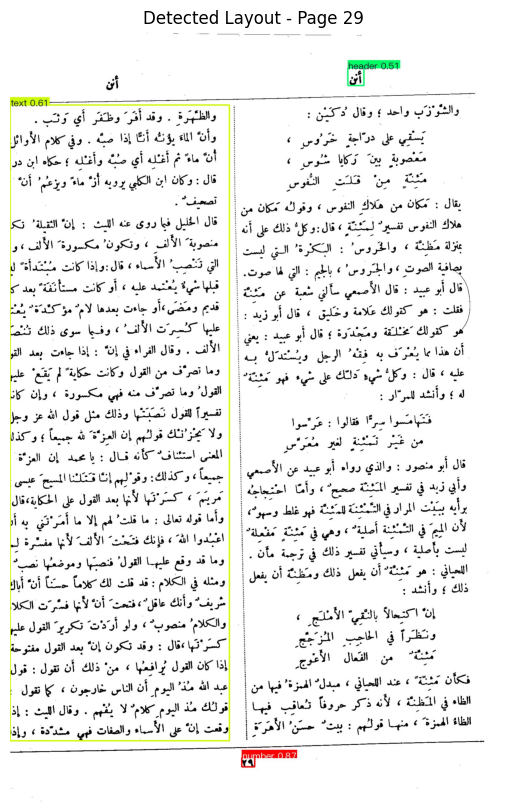

{'res': {'input_path': None, 'page_index': None, 'boxes': [{'cls_id': 3, 'label': 'number', 'score': 0.8279756307601929, 'coordinate': [np.float32(851.44135), np.float32(2526.2605), np.float32(892.99786), np.float32(2554.4734)]}, {'cls_id': 1, 'label': 'image', 'score': 0.6912596225738525, 'coordinate': [np.float32(51.40956), np.float32(235.01227), np.float32(1697.5377), np.float32(2468.6497)]}]}}
There is not input file name as reference for name of saved result file. So the saved result file would be named with timestamp and random number: `1761172434_3273`.



=== Page 30, Result 1 ===


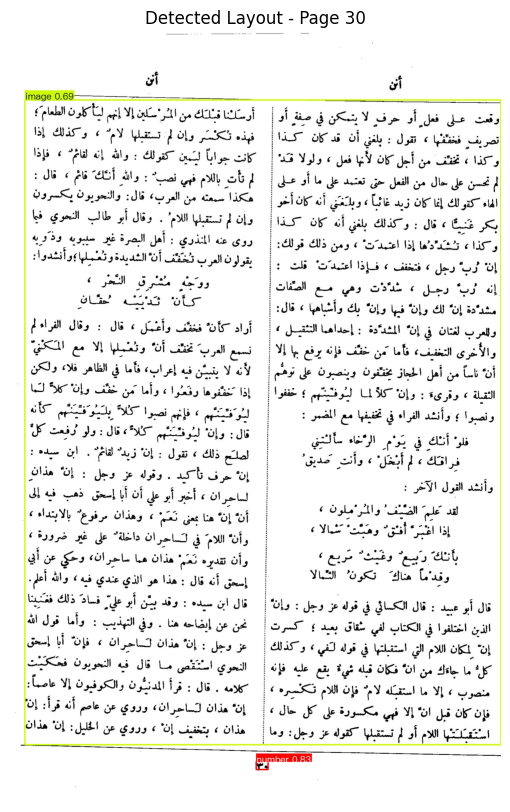

In [41]:

for i, page in enumerate(pages):
    # Convert the page to RGB and then to BGR (for PaddleOCR)
    page = page.convert("RGB")
    img = np.array(page, dtype="uint8")
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    # Predict layout
    output = model.predict(input=img, batch_size=1, layout_nms=True)

    for j, res in enumerate(output):
        print(f"\n=== Page {i+1}, Result {j+1} ===")
        res.print()  # print detection info
        res.save_to_json(save_path="output")  # save JSON metadata

        # Save annotated image
        save_path = f"output/page_{i+1}_detected.jpg"
        res.save_to_img(save_path=save_path)

        # Load the annotated image for visualization
        annotated_img = cv2.imread(save_path)
        annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

        # Display using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(annotated_img)
        plt.axis("off")
        plt.title(f"Detected Layout - Page {i+1}")
        plt.show()